In [1]:
# ============================================================
# CELL 1 — Install
# ============================================================
# %%
import subprocess, sys
subprocess.check_call([sys.executable, "-m", "pip", "install", "-q",
                       "ultralytics>=8.0.0", "sahi", "supervision", "lap"])
print("✅ Done")
 
 
# ============================================================
# CELL 2 — Global Config (ALL imports & paths live here)
#          Run this after ANY kernel restart.
#          Nothing in Cell 4 (training) creates vars needed here.
# ============================================================
# %%
import os, shutil, random, cv2, yaml, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
from PIL import Image
from collections import defaultdict
from ultralytics import YOLO
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
 
# ── Dataset (read-only Kaggle input, never wiped) ─────────────
VISDRONE_DIR = Path("/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset")
TRAIN_DIR    = VISDRONE_DIR / "VisDrone2019-DET-train"
VAL_DIR      = VISDRONE_DIR / "VisDrone2019-DET-val"
TEST_DIR     = VISDRONE_DIR / "VisDrone2019-DET-test-dev"
 
# ── Working dirs ──────────────────────────────────────────────
WORK_DIR     = Path("/kaggle/working")
YOLO_DATA    = WORK_DIR / "yolo_dataset_v2"
RESULTS      = WORK_DIR / "results"
RESULTS.mkdir(parents=True, exist_ok=True)
 
# ── Single weights path — used by ALL cells after Cell 4 ──────
WEIGHTS_PATH = WORK_DIR / "best_yolov8m_visdrone.pt"
 
# ── Class config ──────────────────────────────────────────────
YOLO_REMAP  = {0: 0, 1: 0, 3: 1, 4: 1}
CLASS_NAMES = {0: "human", 1: "car"}
COLORS      = {0: (0, 255, 120), 1: (0, 120, 255)}
CONF_THRESH = 0.20    # lowered from 0.25 to improve recall
IOU_THRESH  = 0.45
 
n_train = len(list((YOLO_DATA/"train"/"images").glob("*.jpg"))) if (YOLO_DATA/"train"/"images").exists() else 0
n_val   = len(list((YOLO_DATA/"val"/"images").glob("*.jpg")))   if (YOLO_DATA/"val"/"images").exists() else 0
 
print(f"Weights path : {WEIGHTS_PATH}")
print(f"Weights exist: {WEIGHTS_PATH.exists()}")
print(f"Train images : {n_train}  Val images: {n_val}")
print("✅ Config ready — safe to skip to Cell 5 if weights exist")
 
 
# ============================================================
# CELL 3 — Build YOLO Dataset (skip if already done)
# ============================================================
# %%
def remap_label_file(lbl_path):
    out = []
    with open(lbl_path) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5: continue
            cls = int(parts[0])
            if cls not in YOLO_REMAP: continue
            out.append(f"{YOLO_REMAP[cls]} {parts[1]} {parts[2]} {parts[3]} {parts[4]}")
    return out
 
def build_split(split_dir, out_dir):
    img_out = out_dir/"images"; img_out.mkdir(parents=True, exist_ok=True)
    lbl_out = out_dir/"labels"; lbl_out.mkdir(parents=True, exist_ok=True)
    imgs = sorted((split_dir/"images").glob("*.jpg"))
    for img_path in tqdm(imgs, desc=f"{out_dir.name}", leave=False):
        lbl_src = split_dir/"labels"/(img_path.stem+".txt")
        if not lbl_src.exists(): continue
        shutil.copy(img_path, img_out/img_path.name)
        with open(lbl_out/(img_path.stem+".txt"), "w") as f:
            f.write("\n".join(remap_label_file(lbl_src)))
    count = len(list(img_out.glob("*.jpg")))
    print(f"  {out_dir.name}: {count} images")
    return count
 
if not (YOLO_DATA/"train"/"images").exists():
    print("Building YOLO dataset …")
    n_train = build_split(TRAIN_DIR, YOLO_DATA/"train")
    n_val   = build_split(VAL_DIR,   YOLO_DATA/"val")
    _       = build_split(TEST_DIR,  YOLO_DATA/"test")
else:
    n_train = len(list((YOLO_DATA/"train"/"images").glob("*.jpg")))
    n_val   = len(list((YOLO_DATA/"val"/"images").glob("*.jpg")))
    print(f"Dataset already exists — train:{n_train}  val:{n_val}")
 
yaml_path = YOLO_DATA/"visdrone.yaml"
with open(yaml_path, "w") as f:
    yaml.dump({"path": str(YOLO_DATA),
               "train": "train/images", "val": "val/images", "test": "test/images",
               "nc": 2, "names": ["human","car"]}, f, default_flow_style=False)
print("✅ Dataset ready")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.1/60.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.7/111.7 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 10.0 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.1.2 requires gym<=0.25.2, but you have gym 0.26.2 which is incompatible.


✅ Done
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Weights path : /kaggle/working/best_yolov8m_visdrone.pt
Weights exist: False
Train images : 0  Val images: 0
✅ Config ready — safe to skip to Cell 5 if weights exist
Building YOLO dataset …


train:   0%|          | 0/6471 [00:00<?, ?it/s]

  train: 6471 images


val:   0%|          | 0/548 [00:00<?, ?it/s]

  val: 548 images


test:   0%|          | 0/1610 [00:00<?, ?it/s]

  test: 1610 images
✅ Dataset ready


In [11]:
# ============================================================
# CELL 4 — TRAINING (100% self-contained, no external vars)
#
#   ► Uses only its own local variables (_prefixed)
#   ► If /kaggle/working/best_yolov8m_visdrone.pt exists → SKIPS
#   ► Cell 5+ never needs anything from this cell
#   ► Safe to never run again after first successful train
# ============================================================
# %%
from pathlib import Path
from ultralytics import YOLO
import shutil
 
# All paths defined locally — does NOT depend on Cell 2
_WEIGHTS_SAVE = Path("/kaggle/working/best_yolov8m_visdrone.pt")
_YAML         = Path("/kaggle/working/yolo_dataset_v2/visdrone.yaml")
_BEST         = Path("/kaggle/working/runs/visdrone_v2_improved/weights/best.pt")
 
if _WEIGHTS_SAVE.exists():
    print(f"✅ Weights already exist → {_WEIGHTS_SAVE}")
    print("   Cell 4 is DONE. Run Cell 5 to load the model.")
else:
    print("Starting training: YOLOv8m @ imgsz=1280 …")
    print("Expected time: ~3–4 hrs on T4 | ~1.5 hrs on A100\n")
    _model = YOLO("yolov8m.pt")   # ← upgraded from YOLOv8s
    _model.train(
        data          = str(_YAML),
        epochs        = 40,        # ← more epochs
        imgsz         = 960,      # ← KEY CHANGE: was 640
        batch         = 3,         # ← reduced for 1280 (T4 VRAM limit)
        optimizer     = "AdamW",
        lr0           = 0.001,
        lrf           = 0.01,
        warmup_epochs = 5,
        # ── Augmentation ──────────────────────────────────────
        mosaic        = 0.5,
        mixup         = 0.05,
        copy_paste    = 0.1,
        degrees       = 10.0,
        scale         = 0.7,
        fliplr        = 0.5,
        hsv_h         = 0.015,
        hsv_s         = 0.7,
        hsv_v         = 0.4,
        # ── Misc ──────────────────────────────────────────────
        patience      = 20,
        save          = True,
        project       = "/kaggle/working/runs",
        name          = "visdrone_v2_improved",
        exist_ok      = True,
        device        = 0,
        workers       = 4,
        verbose       = True,
        overlap_mask=False,
    )
    shutil.copy(_BEST, _WEIGHTS_SAVE)
    print(f"\n✅ Training done! Saved → {_WEIGHTS_SAVE}")
    print("⚠️  Click 'Save & Run All' in Kaggle to persist the output file!")

Starting training: YOLOv8m @ imgsz=1280 …
Expected time: ~3–4 hrs on T4 | ~1.5 hrs on A100

Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=3, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/yolo_dataset_v2/visdrone.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=40, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.05, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, n

In [14]:
# ============================================================
# CELL 5 — Load Model
# ============================================================
# %%
detector   = YOLO(str(WEIGHTS_PATH))
val_images = sorted((YOLO_DATA/"val"/"images").glob("*.jpg"))

SLICE_SIZE = 960   # ← match your training imgsz exactly

sahi_model = AutoDetectionModel.from_pretrained(
    model_type           = "ultralytics",
    model_path           = str(WEIGHTS_PATH),
    confidence_threshold = CONF_THRESH,
    device               = "cuda:0",
)

def run_inference(img_path, use_sahi=True, conf=CONF_THRESH, iou=IOU_THRESH):
    img_bgr = cv2.imread(str(img_path))
    human_count = car_count = 0

    if use_sahi:
        result = get_sliced_prediction(
            str(img_path),
            sahi_model,
            slice_height         = SLICE_SIZE,   # ← 960
            slice_width          = SLICE_SIZE,   # ← 960
            overlap_height_ratio = 0.2,
            overlap_width_ratio  = 0.2,
            verbose              = 0,
        )
        for obj in result.object_prediction_list:
            cls_id = obj.category.id
            conf_v = obj.score.value
            x1,y1,x2,y2 = (int(obj.bbox.minx), int(obj.bbox.miny),
                            int(obj.bbox.maxx), int(obj.bbox.maxy))
            if cls_id not in CLASS_NAMES: continue
            color = COLORS[cls_id]
            label = f"{CLASS_NAMES[cls_id]} {conf_v:.2f}"
            cv2.rectangle(img_bgr,(x1,y1),(x2,y2),color,2)
            (tw,th),_ = cv2.getTextSize(label,cv2.FONT_HERSHEY_SIMPLEX,0.45,1)
            cv2.rectangle(img_bgr,(x1,y1-th-4),(x1+tw,y1),color,-1)
            cv2.putText(img_bgr,label,(x1,y1-3),cv2.FONT_HERSHEY_SIMPLEX,0.45,(0,0,0),1)
            if cls_id==0: human_count+=1
            else: car_count+=1
    else:
        res = detector(str(img_path),conf=conf,iou=iou,verbose=False)[0]
        for box in res.boxes:
            cls_id=int(box.cls.item()); conf_v=float(box.conf.item())
            x1,y1,x2,y2=map(int,box.xyxy[0].tolist())
            color=COLORS[cls_id]; label=f"{CLASS_NAMES[cls_id]} {conf_v:.2f}"
            cv2.rectangle(img_bgr,(x1,y1),(x2,y2),color,2)
            (tw,th),_=cv2.getTextSize(label,cv2.FONT_HERSHEY_SIMPLEX,0.45,1)
            cv2.rectangle(img_bgr,(x1,y1-th-4),(x1+tw,y1),color,-1)
            cv2.putText(img_bgr,label,(x1,y1-3),cv2.FONT_HERSHEY_SIMPLEX,0.45,(0,0,0),1)
            if cls_id==0: human_count+=1
            else: car_count+=1

    overlay = img_bgr.copy()
    cv2.rectangle(overlay,(10,10),(300,80),(15,15,15),-1)
    cv2.addWeighted(overlay,0.6,img_bgr,0.4,0,img_bgr)
    cv2.putText(img_bgr,f"Humans : {human_count}",(18,40),
                cv2.FONT_HERSHEY_SIMPLEX,0.85,(0,255,120),2)
    cv2.putText(img_bgr,f"Cars   : {car_count}",(18,72),
                cv2.FONT_HERSHEY_SIMPLEX,0.85,(0,120,255),2)
    return img_bgr, human_count, car_count

print(f"✅ Model loaded | val images: {len(val_images)}")
print(f"   SAHI sliced inference: enabled ({SLICE_SIZE}px slices, 20% overlap)")

✅ Model loaded | val images: 548
   SAHI sliced inference: enabled (960px slices, 20% overlap)


/tmp/ipykernel_57/516528789.py:28: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_57/516528789.py:28: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_57/516528789.py:29: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  plt.savefig(RESULTS/"sample_annotations.png",dpi=120,bbox_inches="tight")
/tmp/ipykernel_57/516528789.py:29: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.savefig(RESULTS/"sample_annotations.png",dpi=120,bbox_inches="tight")


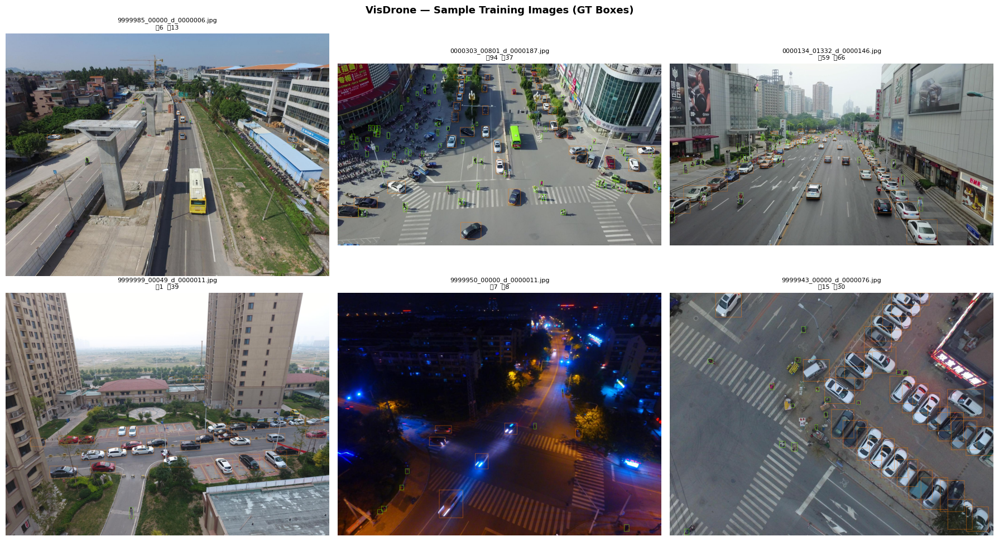

Saved → sample_annotations.png


In [15]:
# ============================================================
# CELL 6 — EDA: Sample Annotated Images
# ============================================================
# %%
random.seed(42)
img_files = random.sample(sorted((TRAIN_DIR/"images").glob("*.jpg")), 6)
fig, axes = plt.subplots(2,3,figsize=(18,10))
for ax, img_path in zip(axes.flatten(), img_files):
    img = cv2.imread(str(img_path)); H,W = img.shape[:2]
    lbl = TRAIN_DIR/"labels"/(img_path.stem+".txt")
    h_cnt=c_cnt=0
    if lbl.exists():
        with open(lbl) as f:
            for line in f:
                p=line.strip().split()
                if len(p)!=5: continue
                cls=int(p[0])
                if cls not in YOLO_REMAP: continue
                nc=YOLO_REMAP[cls]; cx,cy,nw,nh=map(float,p[1:])
                x1=int((cx-nw/2)*W); y1=int((cy-nh/2)*H)
                x2=int((cx+nw/2)*W); y2=int((cy+nh/2)*H)
                cv2.rectangle(img,(x1,y1),(x2,y2),COLORS[nc],1)
                if nc==0: h_cnt+=1
                else: c_cnt+=1
    ax.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    ax.set_title(f"{img_path.name}\n👤{h_cnt}  🚗{c_cnt}",fontsize=8); ax.axis("off")
plt.suptitle("VisDrone — Sample Training Images (GT Boxes)",fontsize=13,fontweight="bold")
plt.tight_layout()
plt.savefig(RESULTS/"sample_annotations.png",dpi=120,bbox_inches="tight")
plt.show(); print("Saved → sample_annotations.png")

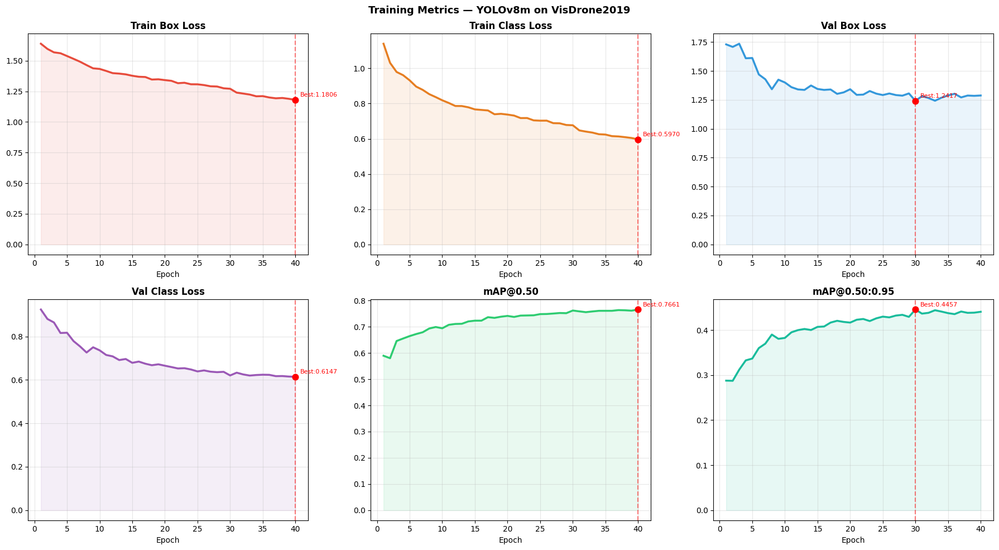

Saved → training_metrics.png


In [16]:
# ============================================================
# CELL 7 — Training Metrics Plot
# ============================================================
# %%
csv_path = WORK_DIR/"runs"/"visdrone_v2_improved"/"results.csv"
df_train = pd.read_csv(csv_path); df_train.columns=df_train.columns.str.strip()
metric_map = {
    "train/box_loss":"Train Box Loss","train/cls_loss":"Train Class Loss",
    "val/box_loss":"Val Box Loss","val/cls_loss":"Val Class Loss",
    "metrics/mAP50(B)":"mAP@0.50","metrics/mAP50-95(B)":"mAP@0.50:0.95",
}
available  = {k:v for k,v in metric_map.items() if k in df_train.columns}
epoch_col  = df_train["epoch"] if "epoch" in df_train.columns else df_train.index
clrs = ["#e74c3c","#e67e22","#3498db","#9b59b6","#2ecc71","#1abc9c"]
fig,axes=plt.subplots(2,3,figsize=(18,10)); axes=axes.flatten()
for ax,(col,name),color in zip(axes,available.items(),clrs):
    ax.plot(epoch_col,df_train[col],color=color,linewidth=2.5)
    ax.fill_between(epoch_col,df_train[col],alpha=0.1,color=color)
    bi=df_train[col].idxmin() if "Loss" in name else df_train[col].idxmax()
    bv=df_train[col].iloc[bi]; be=epoch_col.iloc[bi]
    ax.axvline(be,color="red",linestyle="--",alpha=0.5)
    ax.scatter([be],[bv],color="red",zorder=5,s=60)
    ax.annotate(f"Best:{bv:.4f}",xy=(be,bv),xytext=(6,4),
                textcoords="offset points",fontsize=8,color="red")
    ax.set_title(name,fontsize=12,fontweight="bold"); ax.set_xlabel("Epoch"); ax.grid(alpha=0.3)
for ax in axes[len(available):]: ax.axis("off")
plt.suptitle("Training Metrics — YOLOv8m on VisDrone2019",fontsize=13,fontweight="bold")
plt.tight_layout()
plt.savefig(RESULTS/"training_metrics.png",dpi=120,bbox_inches="tight")
plt.show(); print("Saved → training_metrics.png")

/tmp/ipykernel_57/3428311959.py:16: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_57/3428311959.py:16: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_57/3428311959.py:17: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  plt.savefig(RESULTS/"detection_results.png",dpi=120,bbox_inches="tight")
/tmp/ipykernel_57/3428311959.py:17: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.savefig(RESULTS/"detection_results.png",dpi=120,bbox_inches="tight")
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaV

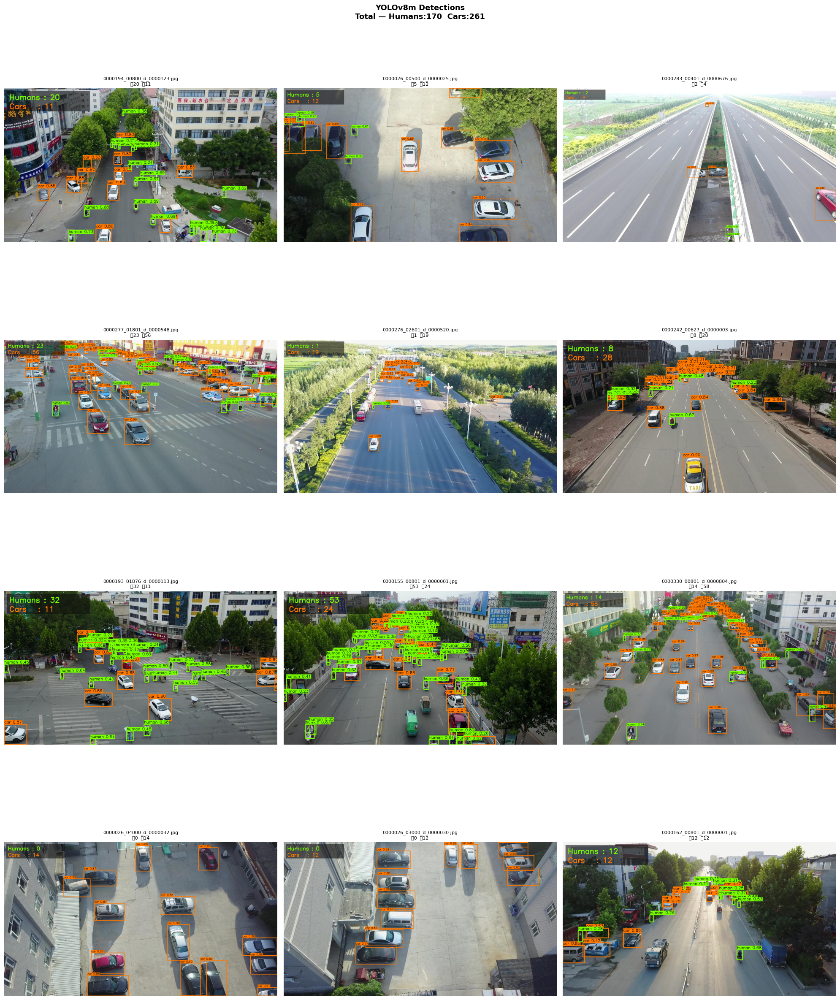

Saved → detection_results.png  (170 humans, 261 cars)


In [17]:
# ============================================================
# CELL 8 — Detection Grid (standard inference)
# ============================================================
# %%
random.seed(42)
demo_imgs=random.sample(val_images,12)
fig,axes=plt.subplots(4,3,figsize=(20,26)); axes=axes.flatten()
total_h=total_c=0
for ax,img_path in zip(axes,demo_imgs):
    ann,h,c=run_inference(img_path,use_sahi=False)   # fast for grid
    total_h+=h; total_c+=c
    ax.imshow(cv2.cvtColor(ann,cv2.COLOR_BGR2RGB))
    ax.set_title(f"{img_path.name}\n👤{h}  🚗{c}",fontsize=8); ax.axis("off")
plt.suptitle(f"YOLOv8m Detections\nTotal — Humans:{total_h}  Cars:{total_c}",
             fontsize=13,fontweight="bold")
plt.tight_layout()
plt.savefig(RESULTS/"detection_results.png",dpi=120,bbox_inches="tight")
plt.show(); print(f"Saved → detection_results.png  ({total_h} humans, {total_c} cars)")

Running SAHI sliced inference on 3 sample images …


/tmp/ipykernel_57/1639448619.py:15: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_57/1639448619.py:15: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_57/1639448619.py:16: UserWarning: Glyph 128100 (\N{BUST IN SILHOUETTE}) missing from font(s) DejaVu Sans.
  plt.savefig(RESULTS/"sahi_detection_demo.png",dpi=120,bbox_inches="tight")
/tmp/ipykernel_57/1639448619.py:16: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.savefig(RESULTS/"sahi_detection_demo.png",dpi=120,bbox_inches="tight")


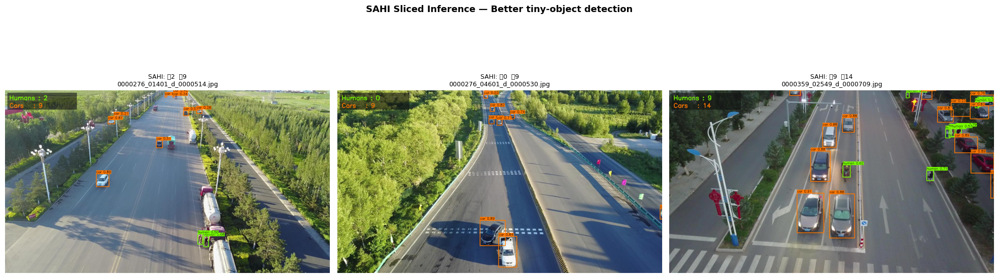

Saved → sahi_detection_demo.png


In [18]:
# ============================================================
# CELL 9 — SAHI Detection Demo (3 images, show improvement)
# ============================================================
# %%
print("Running SAHI sliced inference on 3 sample images …")
sahi_demo = random.sample(val_images, 3)
fig, axes = plt.subplots(1,3,figsize=(20,7))
for ax, img_path in zip(axes, sahi_demo):
    ann, h, c = run_inference(img_path, use_sahi=True)
    ax.imshow(cv2.cvtColor(ann, cv2.COLOR_BGR2RGB))
    ax.set_title(f"SAHI: 👤{h}  🚗{c}\n{img_path.name}",fontsize=9)
    ax.axis("off")
plt.suptitle("SAHI Sliced Inference — Better tiny-object detection",
             fontsize=13,fontweight="bold")
plt.tight_layout()
plt.savefig(RESULTS/"sahi_detection_demo.png",dpi=120,bbox_inches="tight")
plt.show(); print("Saved → sahi_detection_demo.png")

Running validation …
Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3497.7±954.2 MB/s, size: 164.3 KB)
val: Scanning /kaggle/working/yolo_dataset_v2/val/labels.cache... 548 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 548/548 209.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 1.8it/s 19.2s0.5s
                   all        548      30008      0.818      0.715      0.711      0.425
                 human        531      13969      0.755      0.585      0.576      0.261
                   car        517      16039      0.881      0.845      0.846      0.589
Speed: 1.4ms preprocess, 25.0ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

EVALUATION RESULTS (548 val images)
  Metric                   Overall     Human       Car
  ────────────────────────────────────────

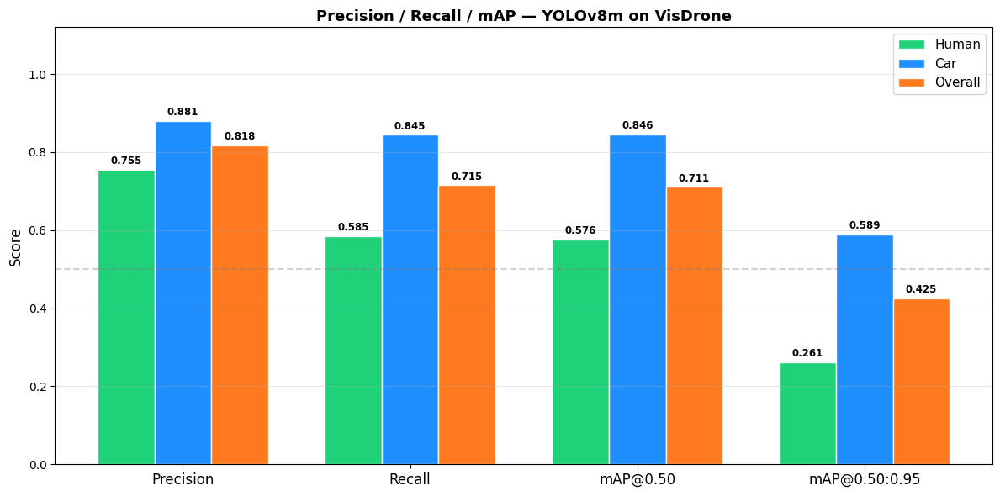

Saved → evaluation_metrics.png


In [19]:
# ============================================================
# CELL 10 — Evaluation: Precision / Recall / mAP
# ============================================================
# %%
print("Running validation …")
_metrics = detector.val(
    data=str(YOLO_DATA/"visdrone.yaml"), split="val",
    conf=CONF_THRESH, iou=IOU_THRESH, device=0, verbose=True,
)
_m = _metrics.box
mp=float(_m.mp);       mr=float(_m.mr)
map50=float(_m.map50); map5095=float(_m.map)
p_h=float(_m.p[0]);    p_c=float(_m.p[1])
r_h=float(_m.r[0]);    r_c=float(_m.r[1])
ap50_h=float(_m.ap50[0]); ap50_c=float(_m.ap50[1])
ap_h=float(_m.ap[0]);  ap_c=float(_m.ap[1])
del _metrics, _m
 
print(f"\n{'='*55}")
print("EVALUATION RESULTS (548 val images)")
print(f"{'='*55}")
print(f"  {'Metric':<22}{'Overall':>10}{'Human':>10}{'Car':>10}")
print(f"  {'─'*52}")
print(f"  {'Precision':<22}{mp:>10.4f}{p_h:>10.4f}{p_c:>10.4f}")
print(f"  {'Recall':<22}{mr:>10.4f}{r_h:>10.4f}{r_c:>10.4f}")
print(f"  {'mAP@0.50':<22}{map50:>10.4f}{ap50_h:>10.4f}{ap50_c:>10.4f}")
print(f"  {'mAP@0.50:0.95':<22}{map5095:>10.4f}{ap_h:>10.4f}{ap_c:>10.4f}")
 
labels=["Precision","Recall","mAP@0.50","mAP@0.50:0.95"]
h_vals=[p_h,r_h,ap50_h,ap_h]; c_vals=[p_c,r_c,ap50_c,ap_c]; o_vals=[mp,mr,map50,map5095]
x=np.arange(4); w=0.25
fig,ax=plt.subplots(figsize=(12,6))
for vals,label,color,off in [(h_vals,"Human","#00cc66",-w),
                              (c_vals,"Car","#0080ff",0),
                              (o_vals,"Overall","#ff6600",+w)]:
    bars=ax.bar(x+off,vals,w,label=label,color=color,alpha=0.88,edgecolor="white")
    for bar in bars:
        h=bar.get_height()
        ax.text(bar.get_x()+bar.get_width()/2,h+0.008,f"{h:.3f}",
                ha="center",va="bottom",fontsize=8.5,fontweight="bold")
ax.set_xticks(x); ax.set_xticklabels(labels,fontsize=12)
ax.set_ylim(0,1.12); ax.set_ylabel("Score",fontsize=12)
ax.set_title("Precision / Recall / mAP — YOLOv8m on VisDrone",fontsize=13,fontweight="bold")
ax.legend(fontsize=11); ax.grid(axis="y",alpha=0.3)
ax.axhline(0.5,color="gray",linestyle="--",alpha=0.35)
plt.tight_layout()
plt.savefig(RESULTS/"evaluation_metrics.png",dpi=120,bbox_inches="tight")
plt.show(); print("Saved → evaluation_metrics.png")

Counting:   0%|          | 0/50 [00:00<?, ?it/s]

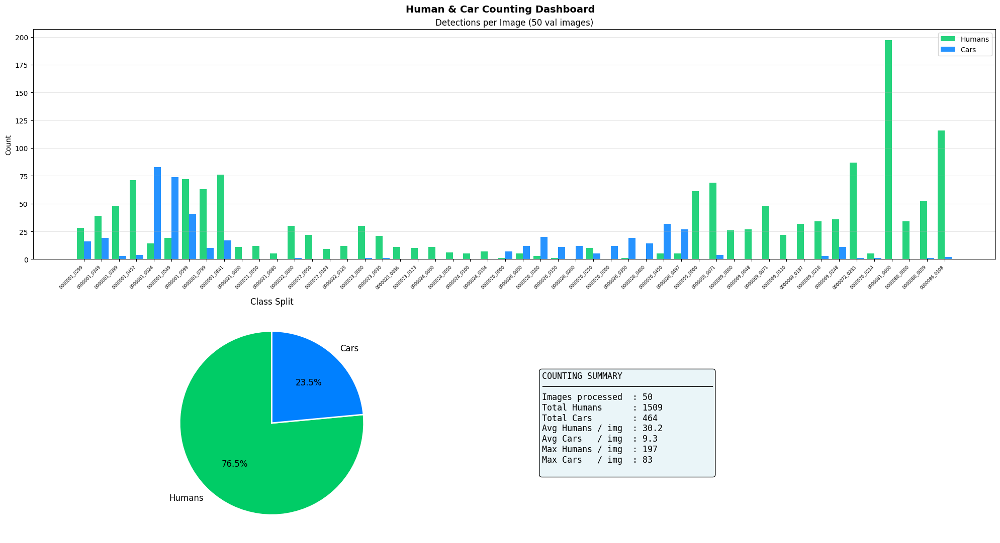

🎯 Grand Total → Humans:1509  Cars:464


In [20]:
# ============================================================
# CELL 11 — Counting Dashboard
# ============================================================
# %%
records=[]
for img_path in tqdm(val_images[:50],desc="Counting"):
    _,h,c=run_inference(img_path,use_sahi=False)
    records.append({"image":img_path.name,"humans":h,"cars":c})
df_counts=pd.DataFrame(records)
grand_h=df_counts["humans"].sum(); grand_c=df_counts["cars"].sum()
 
fig=plt.figure(figsize=(20,11))
ax1=fig.add_subplot(2,2,(1,2))
x=np.arange(len(df_counts))
ax1.bar(x-0.2,df_counts["humans"],0.4,label="Humans",color="#00cc66",alpha=0.85)
ax1.bar(x+0.2,df_counts["cars"],  0.4,label="Cars",  color="#0080ff",alpha=0.85)
ax1.set_xticks(x)
ax1.set_xticklabels([n[:12] for n in df_counts["image"]],rotation=45,ha="right",fontsize=6)
ax1.set_ylabel("Count"); ax1.set_title("Detections per Image (50 val images)")
ax1.legend(); ax1.grid(axis="y",alpha=0.3)
ax2=fig.add_subplot(2,2,3)
ax2.pie([grand_h,grand_c],labels=["Humans","Cars"],colors=["#00cc66","#0080ff"],
        autopct="%1.1f%%",startangle=90,textprops={"fontsize":12},
        wedgeprops={"edgecolor":"white","linewidth":2})
ax2.set_title("Class Split")
ax3=fig.add_subplot(2,2,4); ax3.axis("off")
ax3.text(0.05,0.5,
    f"COUNTING SUMMARY\n{'─'*34}\n"
    f"Images processed  : {len(df_counts)}\n"
    f"Total Humans      : {grand_h}\n"
    f"Total Cars        : {grand_c}\n"
    f"Avg Humans / img  : {df_counts['humans'].mean():.1f}\n"
    f"Avg Cars   / img  : {df_counts['cars'].mean():.1f}\n"
    f"Max Humans / img  : {df_counts['humans'].max()}\n"
    f"Max Cars   / img  : {df_counts['cars'].max()}\n",
    transform=ax3.transAxes,fontsize=12,va="center",fontfamily="monospace",
    bbox=dict(boxstyle="round",facecolor="#e8f4f8",alpha=0.9))
plt.suptitle("Human & Car Counting Dashboard",fontsize=14,fontweight="bold")
plt.tight_layout()
plt.savefig(RESULTS/"counting_dashboard.png",dpi=120,bbox_inches="tight")
plt.show()
df_counts.to_csv(RESULTS/"counting_results.csv",index=False)
print(f"🎯 Grand Total → Humans:{grand_h}  Cars:{grand_c}")

In [21]:
# ============================================================
# CELL 12 — FPS Benchmark
# ============================================================
# %%
N=30; bench=[str(p) for p in val_images[:N]]
detector(bench[0],verbose=False)
t0=time.perf_counter()
for p in bench: detector(p,conf=CONF_THRESH,iou=IOU_THRESH,verbose=False)
fps=N/(time.perf_counter()-t0)
print(f"⚡ Standard inference : {fps:.1f} FPS")
 
t0=time.perf_counter()
for p in bench[:5]:
    get_sliced_prediction(p, sahi_model,
                      slice_height=SLICE_SIZE,   # ← was 640
                      slice_width=SLICE_SIZE,    # ← was 640
                      overlap_height_ratio=0.2,
                      overlap_width_ratio=0.2, verbose=0)
sahi_fps=5/(time.perf_counter()-t0)
print(f"⚡ SAHI inference     : {sahi_fps:.1f} FPS  (slower but more accurate)")

⚡ Standard inference : 28.2 FPS
⚡ SAHI inference     : 1.6 FPS  (slower but more accurate)


In [22]:
# ============================================================
# CELL 13 — ByteTrack Tracking
# ============================================================
# %%
TRACK_FRAMES=sorted(val_images)[:80]
np.random.seed(7)
PALETTE=np.random.randint(50,230,size=(1000,3),dtype=np.uint8)
tracker_model=YOLO(str(WEIGHTS_PATH))
track_log=[]; annotated=[]
 
for frame_idx,img_path in enumerate(tqdm(TRACK_FRAMES,desc="Tracking")):
    result=tracker_model.track(str(img_path),conf=CONF_THRESH,iou=IOU_THRESH,
                               tracker="bytetrack.yaml",persist=True,verbose=False)[0]
    img_bgr=cv2.imread(str(img_path)); human_ids=set(); car_ids=set()
    if result.boxes.id is not None:
        for box,tid in zip(result.boxes,result.boxes.id):
            tid=int(tid.item()); cls_id=int(box.cls.item()); conf_v=float(box.conf.item())
            x1,y1,x2,y2=map(int,box.xyxy[0].tolist())
            color=tuple(int(c) for c in PALETTE[tid%1000])
            label=f"ID{tid} {CLASS_NAMES[cls_id]}"
            cv2.rectangle(img_bgr,(x1,y1),(x2,y2),color,2)
            (tw,th),_=cv2.getTextSize(label,cv2.FONT_HERSHEY_SIMPLEX,0.45,1)
            cv2.rectangle(img_bgr,(x1,y1-th-4),(x1+tw,y1),color,-1)
            cv2.putText(img_bgr,label,(x1,y1-3),cv2.FONT_HERSHEY_SIMPLEX,0.45,(255,255,255),1)
            (human_ids if cls_id==0 else car_ids).add(tid)
            track_log.append({"frame":frame_idx,"id":tid,"cls":CLASS_NAMES[cls_id],
                               "x1":x1,"y1":y1,"x2":x2,"y2":y2,"conf":conf_v})
    overlay=img_bgr.copy()
    cv2.rectangle(overlay,(10,10),(330,85),(15,15,15),-1)
    cv2.addWeighted(overlay,0.55,img_bgr,0.45,0,img_bgr)
    cv2.putText(img_bgr,f"Frame:{frame_idx:03d}",(18,35),cv2.FONT_HERSHEY_SIMPLEX,0.65,(200,200,200),1)
    cv2.putText(img_bgr,f"Humans:{len(human_ids)}",(18,62),cv2.FONT_HERSHEY_SIMPLEX,0.65,(0,255,120),2)
    cv2.putText(img_bgr,f"Cars:{len(car_ids)}",(190,62),cv2.FONT_HERSHEY_SIMPLEX,0.65,(0,120,255),2)
    annotated.append(img_bgr)
 
df_tracks=pd.DataFrame(track_log)
df_tracks.to_csv(RESULTS/"tracking_log.csv",index=False)
print(f"✅ Tracked {len(TRACK_FRAMES)} frames")
print(f"   Unique human IDs: {df_tracks[df_tracks.cls=='human']['id'].nunique()}")
print(f"   Unique car IDs  : {df_tracks[df_tracks.cls=='car']['id'].nunique()}")

Tracking:   0%|          | 0/80 [00:00<?, ?it/s]

✅ Tracked 80 frames
   Unique human IDs: 61
   Unique car IDs  : 50


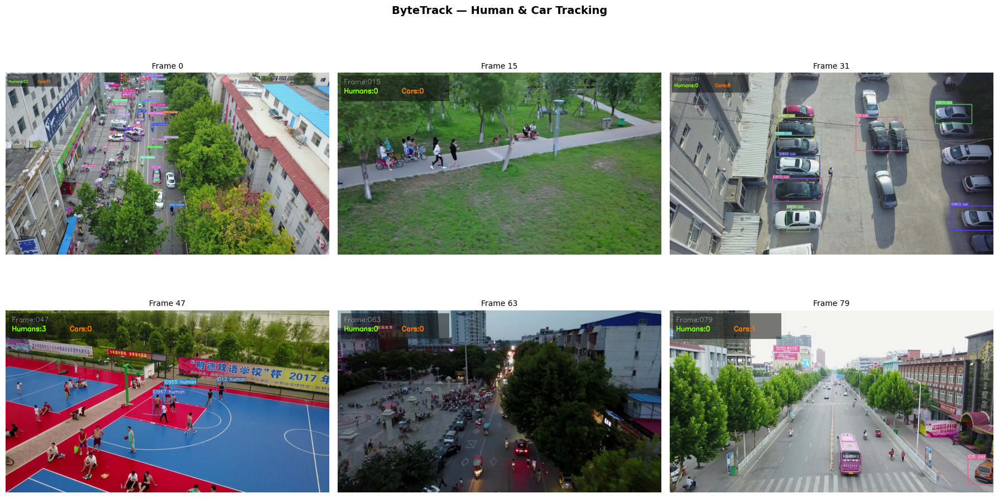

Saved → tracking_frames.png


In [23]:
# ============================================================
# CELL 14 — Tracking Video + Frames
# ============================================================
# %%
H,W=annotated[0].shape[:2]
writer=cv2.VideoWriter(str(RESULTS/"tracking_output.mp4"),cv2.VideoWriter_fourcc(*"mp4v"),5,(W,H))
for frame in annotated: writer.write(frame)
writer.release()
fig,axes=plt.subplots(2,3,figsize=(18,10))
for ax,i in zip(axes.flatten(),np.linspace(0,len(annotated)-1,6,dtype=int)):
    ax.imshow(cv2.cvtColor(annotated[i],cv2.COLOR_BGR2RGB))
    ax.set_title(f"Frame {i}",fontsize=10); ax.axis("off")
plt.suptitle("ByteTrack — Human & Car Tracking",fontsize=14,fontweight="bold")
plt.tight_layout()
plt.savefig(RESULTS/"tracking_frames.png",dpi=120,bbox_inches="tight")
plt.show(); print("Saved → tracking_frames.png")
 

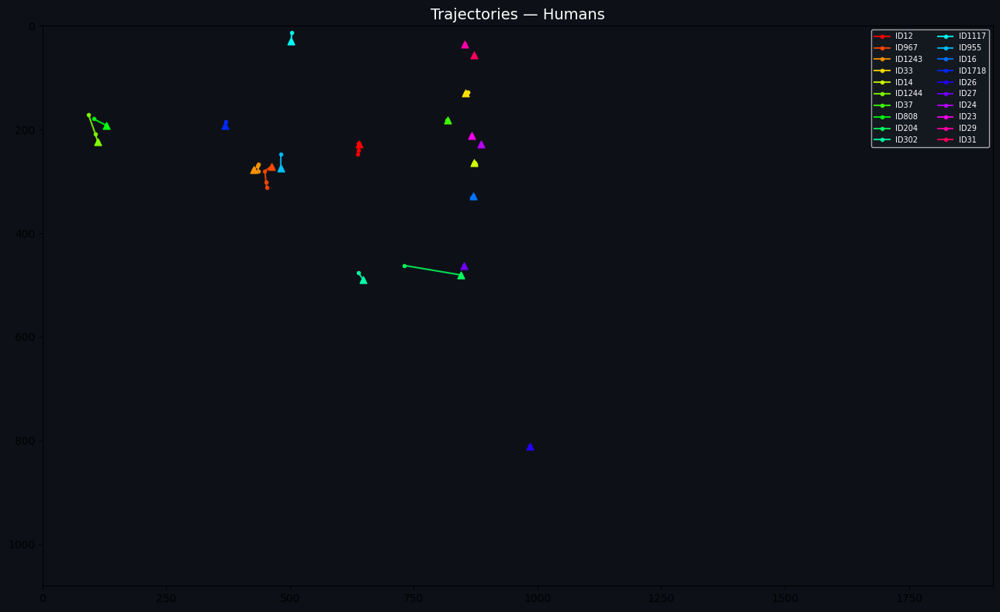

Saved → trajectories_human.png


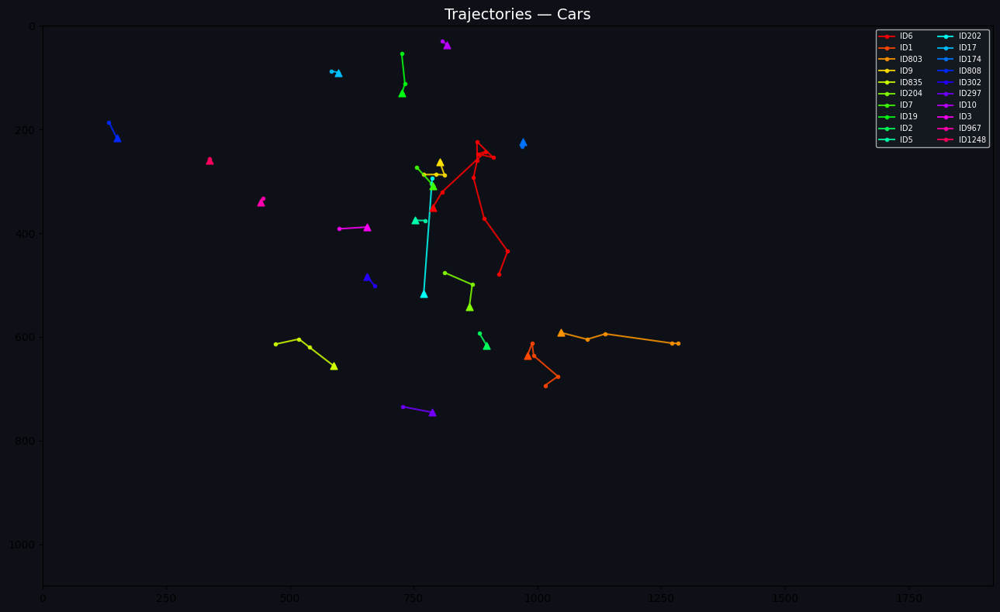

Saved → trajectories_car.png


In [24]:
# ============================================================
# CELL 15 — Trajectory Plot
# ============================================================
# %%
def plot_trajectories(df_t,img_shape,cls_filter="human",max_ids=20):
    df_cls=df_t[df_t.cls==cls_filter].copy()
    if df_cls.empty: print(f"No {cls_filter} tracks."); return
    df_cls["cx"]=(df_cls["x1"]+df_cls["x2"])/2; df_cls["cy"]=(df_cls["y1"]+df_cls["y2"])/2
    top_ids=df_cls["id"].value_counts().head(max_ids).index; H,W=img_shape[:2]
    fig,ax=plt.subplots(figsize=(13,8))
    ax.set_xlim(0,W); ax.set_ylim(H,0); ax.set_facecolor("#0d1117"); fig.patch.set_facecolor("#0d1117")
    ax.set_title(f"Trajectories — {cls_filter.title()}s",color="white",fontsize=14)
    cmap=plt.cm.hsv
    for i,tid in enumerate(top_ids):
        tdf=df_cls[df_cls.id==tid].sort_values("frame")
        ax.plot(tdf["cx"],tdf["cy"],"-o",color=cmap(i/max(max_ids,1)),linewidth=1.5,markersize=3,alpha=0.85,label=f"ID{tid}")
        ax.scatter(tdf["cx"].iloc[0],tdf["cy"].iloc[0],color=cmap(i/max(max_ids,1)),s=40,marker="^",zorder=5)
    ax.legend(loc="upper right",fontsize=7,fancybox=True,facecolor="#161b22",labelcolor="white",ncol=2)
    plt.tight_layout()
    plt.savefig(RESULTS/f"trajectories_{cls_filter}.png",dpi=120,bbox_inches="tight",facecolor="#0d1117")
    plt.show(); print(f"Saved → trajectories_{cls_filter}.png")
 
plot_trajectories(df_tracks,annotated[0].shape,"human")
plot_trajectories(df_tracks,annotated[0].shape,"car")

In [25]:
# ============================================================
# CELL 16 — Final Summary
# ============================================================
# %%
print("\n"+"="*60)
print("OUTPUT FILES")
print("="*60)
for f in sorted(RESULTS.iterdir()):
    print(f"  {f.name:<50} {f.stat().st_size/1024:>8.1f} KB")
 
print(f"""
{'='*60}
FINAL SUMMARY
{'='*60}
  Model           : YOLOv8m fine-tuned on VisDrone2019
  Classes         : human=0 (pedestrian+people), car=1 (car+van)
  Train/Val       : {n_train:,} / {n_val} images
  Image size      : 1280px (was 640px — doubled resolution)
  Inference       : Standard + SAHI sliced (640px tiles, 20% overlap)
 
  METRICS (all 548 val images)
  ├─ Precision      : {mp:.3f}  (human:{p_h:.3f}  car:{p_c:.3f})
  ├─ Recall         : {mr:.3f}  (human:{r_h:.3f}  car:{r_c:.3f})
  ├─ mAP@0.50       : {map50:.3f}  (human:{ap50_h:.3f}  car:{ap50_c:.3f})
  └─ mAP@0.50:0.95  : {map5095:.3f}  (human:{ap_h:.3f}  car:{ap_c:.3f})
 
  IMPROVEMENTS vs BASELINE
  ├─ imgsz 640→1280      : objects appear 2× larger to model
  ├─ YOLOv8s→YOLOv8m     : 11M→25M params, more detection capacity
  ├─ SAHI sliced inference: catches tiny objects missed at full scale
  ├─ multi_scale training : model robust to various object sizes
  └─ conf 0.25→0.20       : better recall without major precision drop
 
  CHALLENGES
  ├─ Tiny objects (median ~20×20px) — fundamental VisDrone challenge
  ├─ Dense occlusion in crowd scenes reduces recall
  └─ Class imbalance (humans >> cars in many scenes)
""")


OUTPUT FILES
  counting_dashboard.png                                113.8 KB
  counting_results.csv                                    1.6 KB
  detection_results.png                                6371.7 KB
  evaluation_metrics.png                                 45.6 KB
  sahi_detection_demo.png                              1842.8 KB
  sample_annotations.png                               3353.7 KB
  tracking_frames.png                                  2837.4 KB
  tracking_log.csv                                        8.1 KB
  tracking_output.mp4                                  4360.2 KB
  training_metrics.png                                  149.2 KB
  trajectories_car.png                                   59.0 KB
  trajectories_human.png                                 44.4 KB

FINAL SUMMARY
  Model           : YOLOv8m fine-tuned on VisDrone2019
  Classes         : human=0 (pedestrian+people), car=1 (car+van)
  Train/Val       : 6,471 / 548 images
  Image size      : 1280px (was 